In [46]:
import os
import math
import sys
sys.path.append('../../')

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
from scipy.ndimage.filters import gaussian_filter

from PIL import Image
from skimage.metrics import structural_similarity as ssim

import torch
import torch.nn as nn
import torch.nn.functional as F

from src.features.distort_images import distort_image
from src.utils import ycbcr2rgb
from src.utils import psnr
from src.models.evaluate_models import evaluate_model

device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
SR_FACTOR = 3

train_pixel_mean = 0.43411854967058106
train_pixel_std = 0.23247274722791464

In [47]:
class SRCNN(nn.Module):
    def __init__(self):
        super(SRCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 64, kernel_size=9, padding=4);
        self.conv2 = nn.Conv2d(64, 32, kernel_size=1, padding=0);
        self.conv3 = nn.Conv2d(32, 1, kernel_size=7, padding=3);

    def forward(self, img):
        out = F.relu(self.conv1(img)) #n_1=64 feature maps
        out = F.relu(self.conv2(out)) #non linear mapping
        out = self.conv3(out)
        return out

In [51]:
SR_model = SRCNN().to(device)

SR_model.load_state_dict(torch.load('../../models/SRCNN_3x.pt'))

<All keys matched successfully>

In [52]:
SR_model

SRCNN(
  (conv1): Conv2d(1, 64, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
  (conv2): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
  (conv3): Conv2d(32, 1, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
)

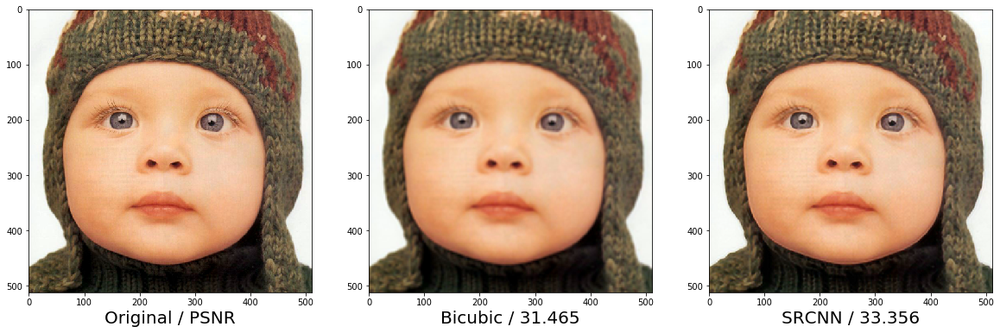

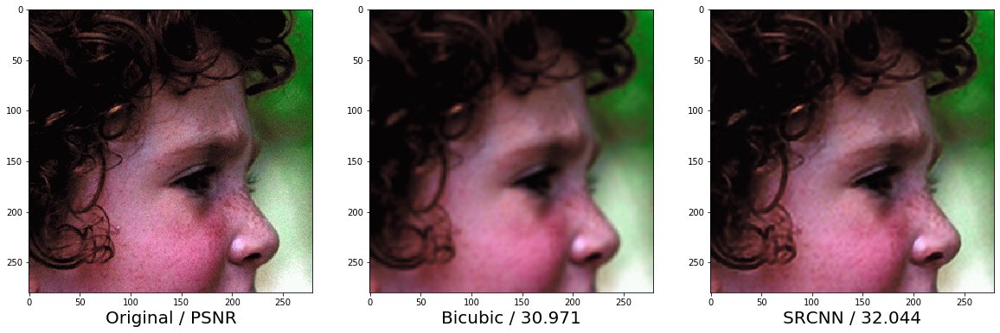

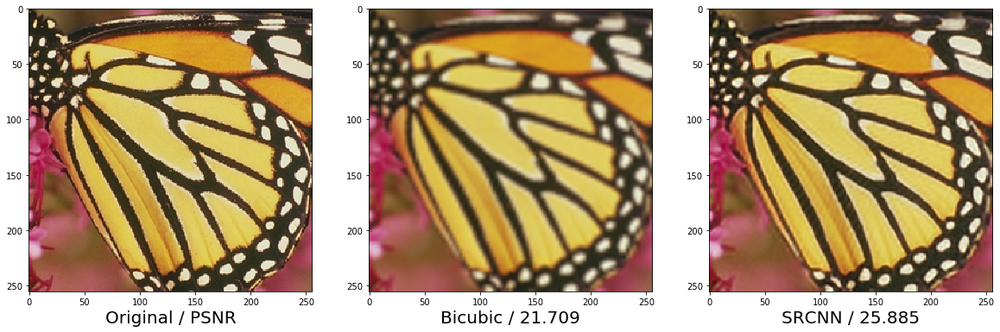

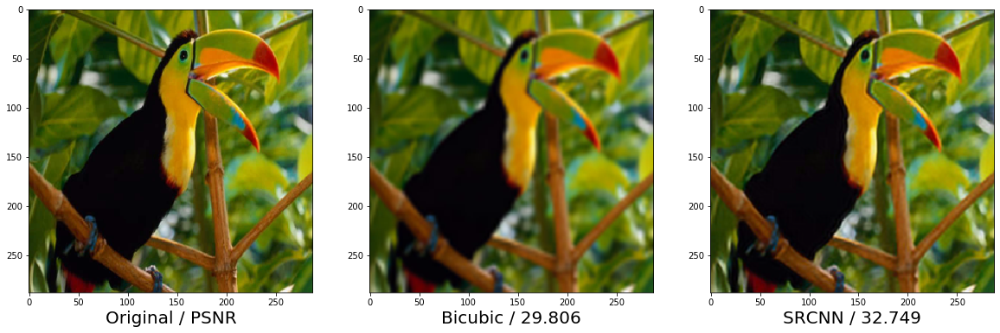

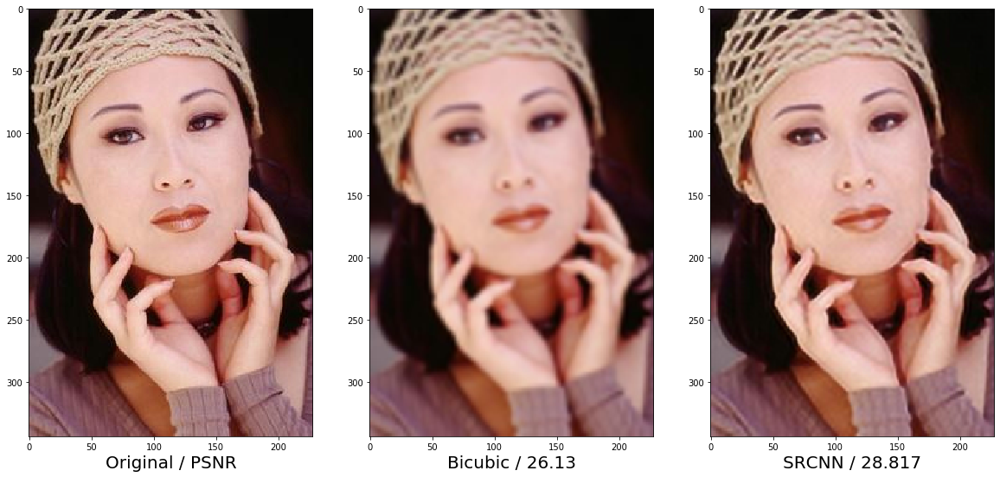

In [55]:
#v1
SR_model.conv1.padding = (4,4)
SR_model.conv3.padding = (3,3)
test5_img_names = [im for im in os.listdir('../../data/raw/test_sets/Set5/') if im[-4:] == '.bmp']

for test_im in test5_img_names:
    path = '../../data/raw/test_sets/Set5/' + test_im
    blurred_test_im = distort_image(path=path, factor=SR_FACTOR, sigma=1, blur=True)
    ImageFile = Image.open(path)
    im = np.array(ImageFile.convert('YCbCr')) 
    
    #normalize
    input = blurred_test_im[:,:,0] / 255.0
    #standardize
    input -= train_pixel_mean
    input /= train_pixel_std
    im_out_Y = SR_model(torch.tensor(input, dtype=torch.float).unsqueeze(0).unsqueeze(0).to(device))
    im_out_Y = im_out_Y.detach().squeeze().squeeze().cpu().numpy().astype(np.float)
    im_out_viz = np.zeros((im_out_Y.shape[0], im_out_Y.shape[1], 3))
    
    #unstandardize 
    im_out_Y = (im_out_Y * train_pixel_std) + train_pixel_mean
    
    #un-normalize
    im_out_Y *= 255.0

    im_out_viz[:,:,0] = im_out_Y
    im_out_viz[:,:,1] = im[:,:,1]
    im_out_viz[:,:,2] = im[:,:,2]


    f, axarr = plt.subplots(1,3, figsize=(20, 20))
    axarr[0].set_xlabel('Original / PSNR', fontsize=20)
    axarr[0].imshow(Image.fromarray(im, 'YCbCr'))

    axarr[1].set_xlabel('Bicubic / ' + str(np.around(psnr(im[:,:,0], blurred_test_im[:,:,0]),3)), fontsize=20)
    axarr[1].imshow(Image.fromarray(blurred_test_im, 'YCbCr'))
    
    axarr[2].set_xlabel('SRCNN / ' + str(np.around(psnr(im[:,:,0], im_out_viz[:,:,0]),3)), fontsize=20)
    axarr[2].imshow(ycbcr2rgb(im_out_viz))





In [56]:
evaluate_model(path='../../data/raw/test_sets/Set5/', 
               model=SR_model, 
               pixel_mean=train_pixel_mean, 
               pixel_std=train_pixel_std, 
               SR_FACTOR=SR_FACTOR, sigma=1.0)

RuntimeError: Expected tensor for argument #1 'input' to have the same device as tensor for argument #2 'weight'; but device 3 does not equal 2 (while checking arguments for cudnn_convolution)

In [ ]:
mse: 28.01622398391864, 30.560327181797152


In [12]:
SR_model = SRCNN().to(device)

checkpoint = torch.load('./checkpoint_SR_with_FDPL_loss.pt')
SR_model.load_state_dict(checkpoint['model_state_dict'])
#optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
epoch = checkpoint['epoch']
loss = checkpoint['val loss']
epoch

6223

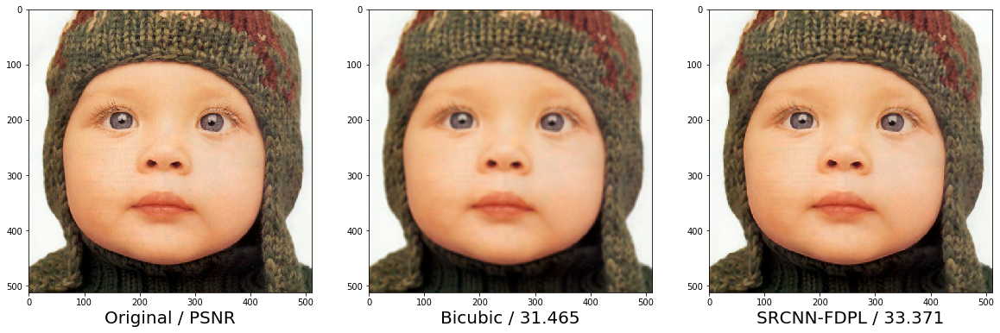

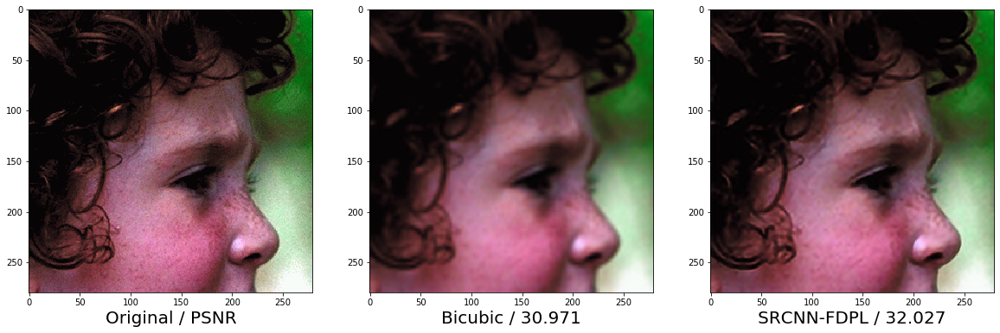

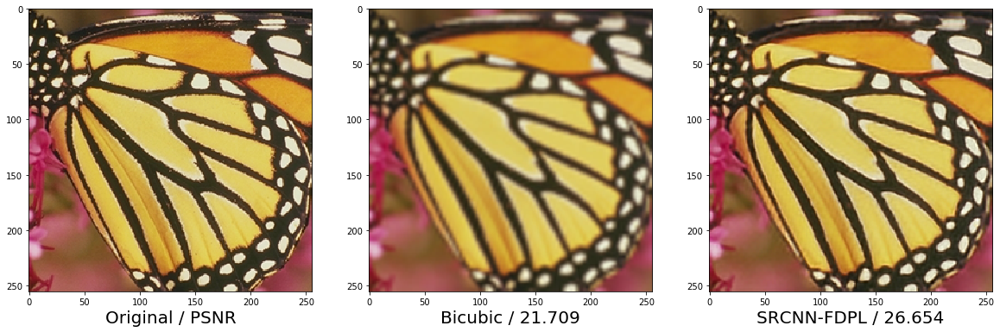

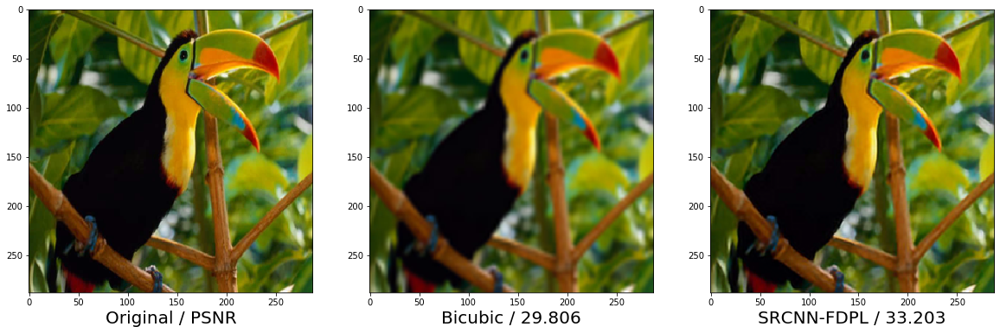

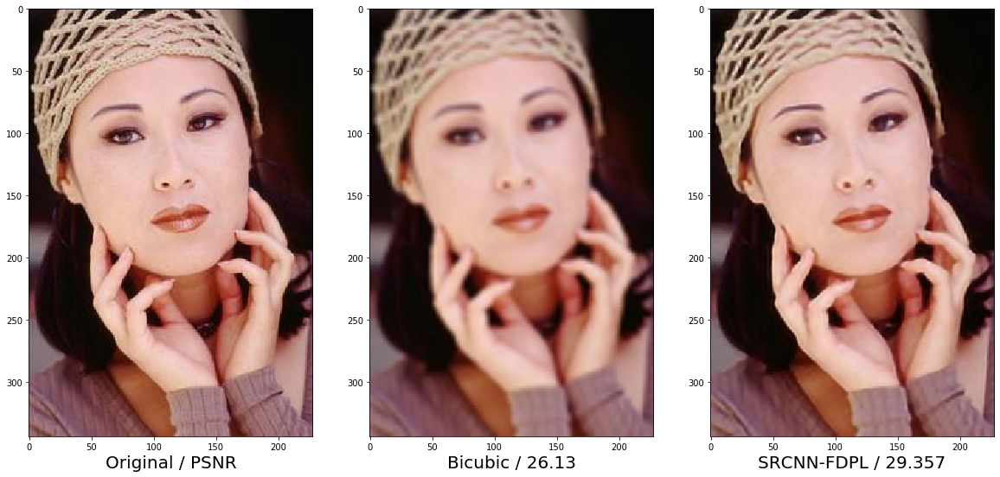

In [13]:
SR_model.conv1.padding = (4,4)
SR_model.conv3.padding = (3,3)
test5_img_names = [im for im in os.listdir('./data/raw/test_sets/Set5/') if im[-4:] == '.bmp']

for test_im in test5_img_names:
    path = './data/raw/test_sets/Set5/' + test_im
    blurred_test_im = distort_image(path=path, factor=SR_FACTOR, sigma=1, blur=True)
    ImageFile = Image.open(path)
    im = np.array(ImageFile.convert('YCbCr')) 
    
    #normalize
    input = blurred_test_im[:,:,0] / 255.0
    #standardize
    input -= train_pixel_mean
    input /= train_pixel_std
    im_out_Y = SR_model(torch.tensor(input, dtype=torch.float).unsqueeze(0).unsqueeze(0).to(device))
    im_out_Y = im_out_Y.detach().squeeze().squeeze().cpu().numpy().astype(np.float)
    im_out_viz = np.zeros((im_out_Y.shape[0], im_out_Y.shape[1], 3))
    
    #unstandardize 
    im_out_Y = (im_out_Y * train_pixel_std) + train_pixel_mean
    
    #un-normalize
    im_out_Y *= 255.0

    im_out_viz[:,:,0] = im_out_Y
    im_out_viz[:,:,1] = im[:,:,1]
    im_out_viz[:,:,2] = im[:,:,2]


    f, axarr = plt.subplots(1,3, figsize=(20, 20))
    axarr[0].set_xlabel('Original / PSNR', fontsize=20)
    axarr[0].imshow(Image.fromarray(im, 'YCbCr'))

    axarr[1].set_xlabel('Bicubic / ' + str(np.around(psnr(im[:,:,0], blurred_test_im[:,:,0]),3)), fontsize=20)
    axarr[1].imshow(Image.fromarray(blurred_test_im, 'YCbCr'))
    
    axarr[2].set_xlabel('SRCNN-FDPL / ' + str(np.around(psnr(im[:,:,0], im_out_viz[:,:,0]),3)), fontsize=20)
    axarr[2].imshow(ycbcr2rgb(im_out_viz))
    f.savefig(test_im[:-4]+'_DCT.png', bbox_inches='tight', dpi=400)




In [14]:
evaluate_model(path='./data/raw/test_sets/Set5/', 
               model=SR_model, 
               pixel_mean=train_pixel_mean, 
               pixel_std=train_pixel_std, 
               SR_FACTOR=SR_FACTOR, sigma=1.0)

(28.01622398391864, 30.915275198819444)

In [ ]:
28.01622398391864, 30.981866202884987

In [15]:
SR_model = SRCNN().to(device)

checkpoint = torch.load('./checkpoint_SR_with_FDPL_loss_mean.pt')
SR_model.load_state_dict(checkpoint['model_state_dict'])
#optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
epoch = checkpoint['epoch']
loss = checkpoint['val loss']
epoch

9051

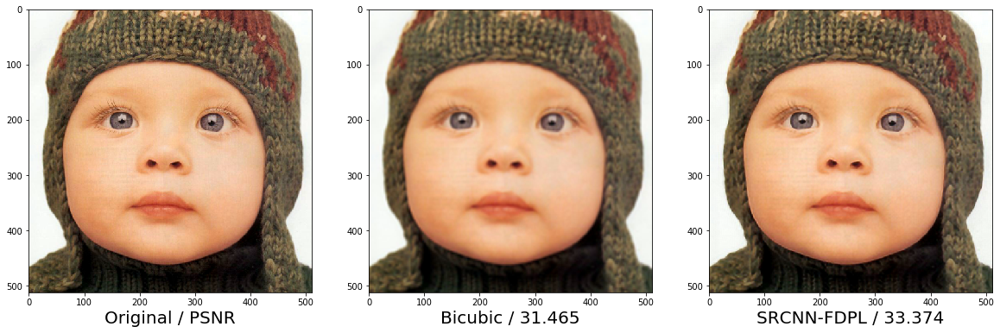

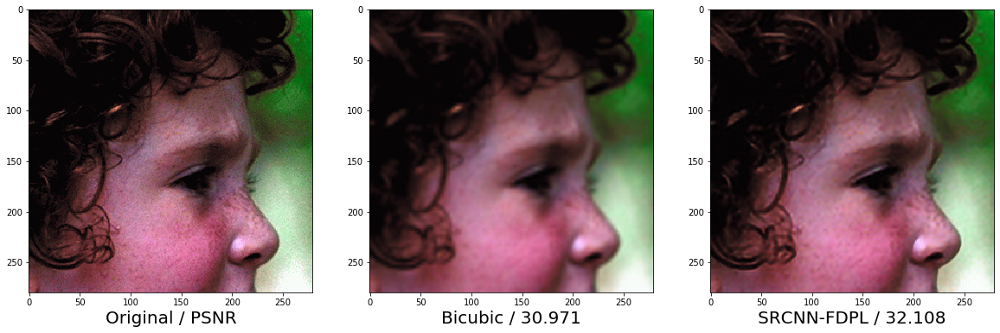

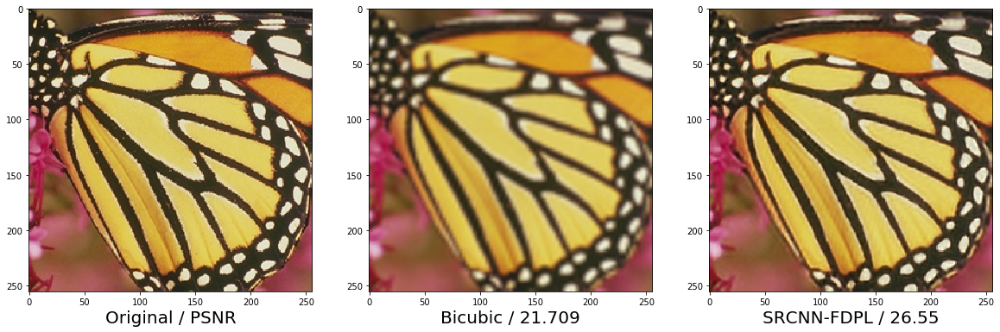

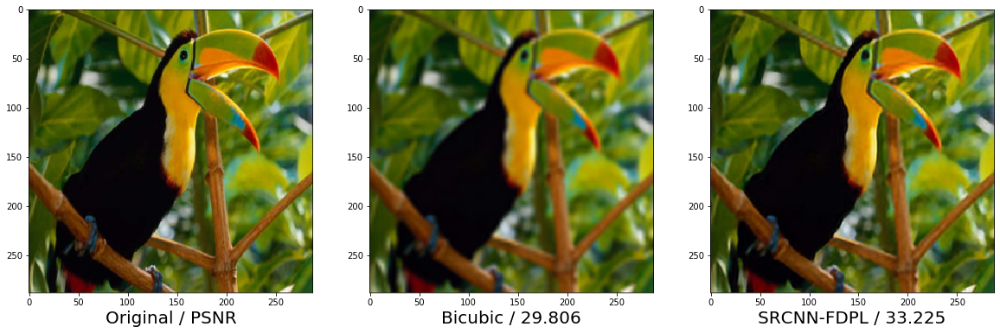

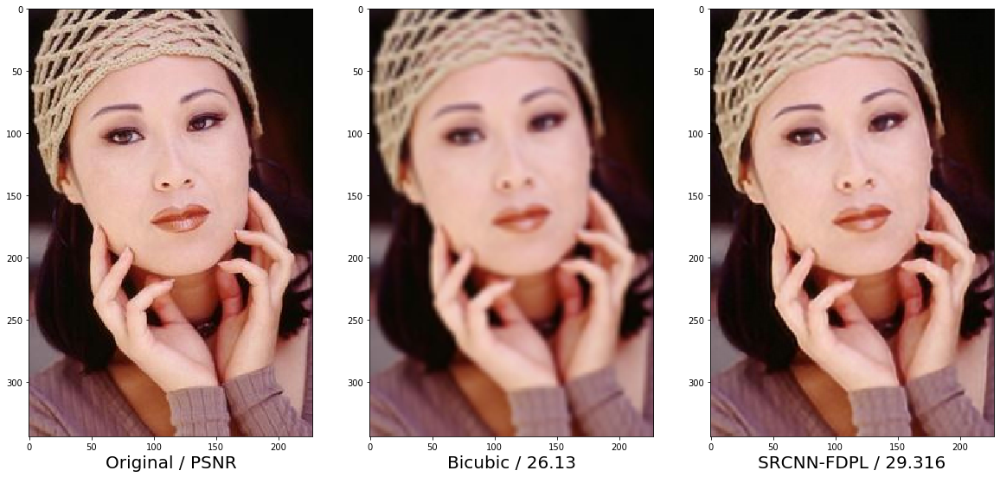

In [16]:
SR_model.conv1.padding = (4,4)
SR_model.conv3.padding = (3,3)
test5_img_names = [im for im in os.listdir('./data/raw/test_sets/Set5/') if im[-4:] == '.bmp']

for test_im in test5_img_names:
    path = './data/raw/test_sets/Set5/' + test_im
    blurred_test_im = distort_image(path=path, factor=SR_FACTOR, sigma=1, blur=True)
    ImageFile = Image.open(path)
    im = np.array(ImageFile.convert('YCbCr')) 
    
    #normalize
    input = blurred_test_im[:,:,0] / 255.0
    #standardize
    input -= train_pixel_mean
    input /= train_pixel_std
    im_out_Y = SR_model(torch.tensor(input, dtype=torch.float).unsqueeze(0).unsqueeze(0).to(device))
    im_out_Y = im_out_Y.detach().squeeze().squeeze().cpu().numpy().astype(np.float)
    im_out_viz = np.zeros((im_out_Y.shape[0], im_out_Y.shape[1], 3))
    
    #unstandardize 
    im_out_Y = (im_out_Y * train_pixel_std) + train_pixel_mean
    
    #un-normalize
    im_out_Y *= 255.0

    im_out_viz[:,:,0] = im_out_Y
    im_out_viz[:,:,1] = im[:,:,1]
    im_out_viz[:,:,2] = im[:,:,2]


    f, axarr = plt.subplots(1,3, figsize=(20, 20))
    axarr[0].set_xlabel('Original / PSNR', fontsize=20)
    axarr[0].imshow(Image.fromarray(im, 'YCbCr'))

    axarr[1].set_xlabel('Bicubic / ' + str(np.around(psnr(im[:,:,0], blurred_test_im[:,:,0]),3)), fontsize=20)
    axarr[1].imshow(Image.fromarray(blurred_test_im, 'YCbCr'))
    
    axarr[2].set_xlabel('SRCNN-FDPL / ' + str(np.around(psnr(im[:,:,0], im_out_viz[:,:,0]),3)), fontsize=20)
    axarr[2].imshow(ycbcr2rgb(im_out_viz))
    f.savefig('./example_images/' +
              test_im[:-4] +
              '_DCT_mean.png', bbox_inches='tight', dpi=400)




In [17]:
evaluate_model(path='./data/raw/test_sets/Set5/', 
               model=SR_model, 
               pixel_mean=train_pixel_mean, 
               pixel_std=train_pixel_std, 
               SR_FACTOR=SR_FACTOR, sigma=1.0)

(28.01622398391864, 30.906479931318557)

In [ ]:
(28.01622398391864, 30.927557158385145)


In [20]:
SR_model = SRCNN().to(device)

checkpoint = torch.load('./SR_with_FDPL_loss_mean_ALT_test.pt')
SR_model.load_state_dict(checkpoint['model_state_dict'])
epoch = checkpoint['epoch']
loss = checkpoint['val loss']
epoch

5162

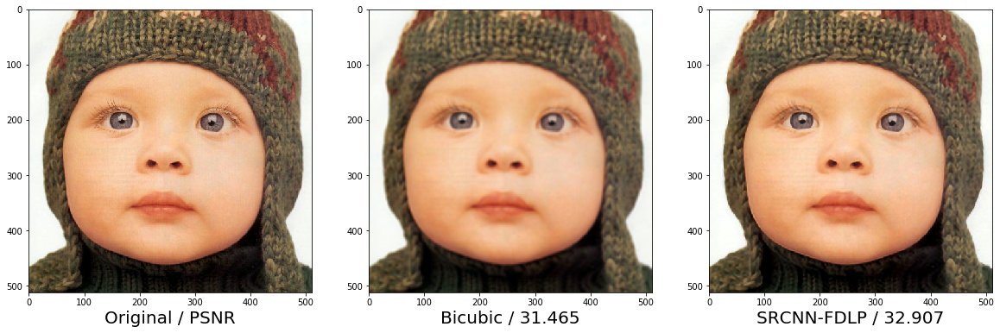

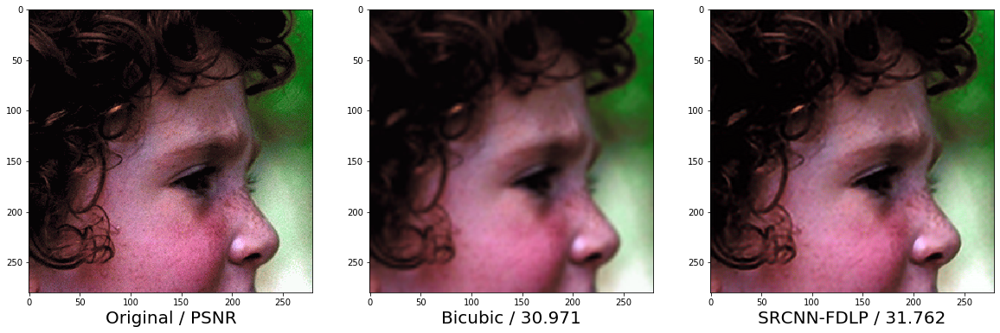

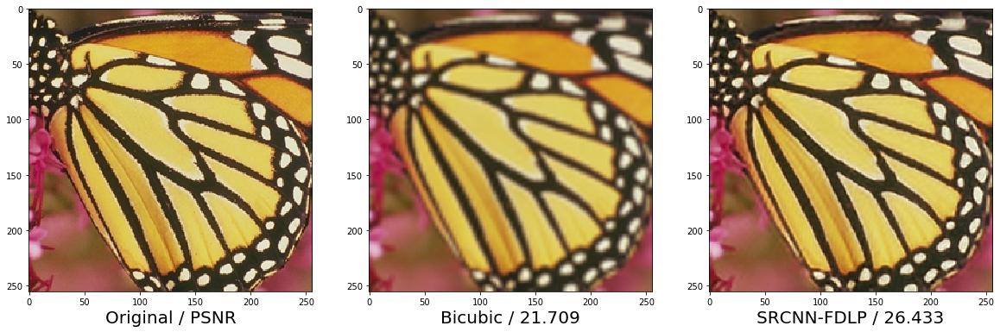

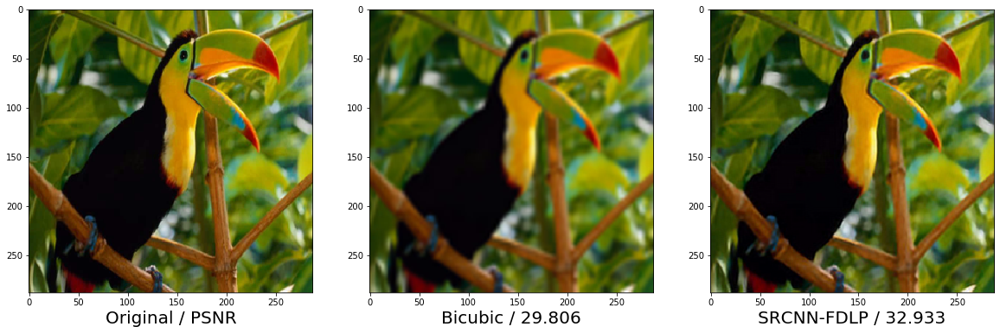

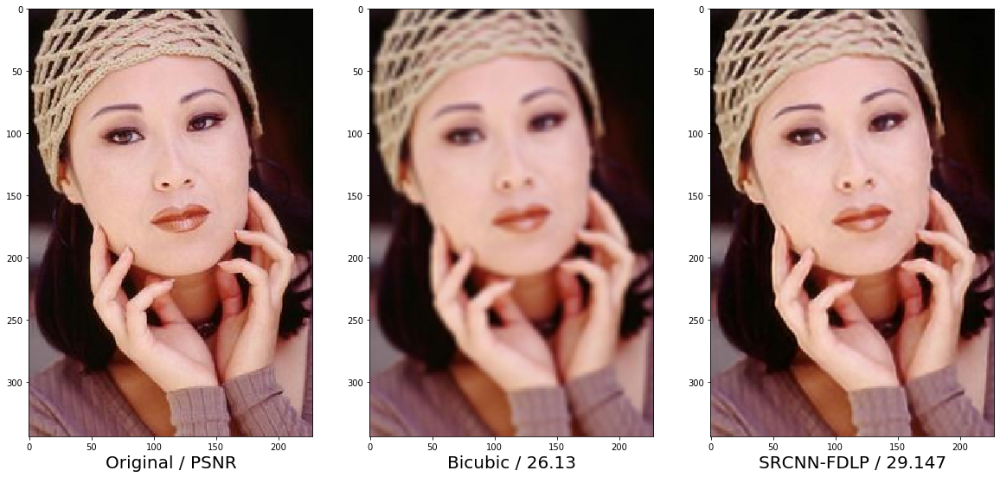

In [21]:
SR_model.conv1.padding = (4,4)
SR_model.conv3.padding = (3,3)
test5_img_names = [im for im in os.listdir('./data/raw/test_sets/Set5/') if im[-4:] == '.bmp']

for test_im in test5_img_names:
    path = './data/raw/test_sets/Set5/' + test_im
    blurred_test_im = distort_image(path=path, factor=SR_FACTOR, sigma=1, blur=True)
    ImageFile = Image.open(path)
    im = np.array(ImageFile.convert('YCbCr')) 
    
    #normalize
    input = blurred_test_im[:,:,0] / 255.0
    #standardize
    input -= train_pixel_mean
    input /= train_pixel_std
    im_out_Y = SR_model(torch.tensor(input, dtype=torch.float).unsqueeze(0).unsqueeze(0).to(device))
    im_out_Y = im_out_Y.detach().squeeze().squeeze().cpu().numpy().astype(np.float)
    im_out_viz = np.zeros((im_out_Y.shape[0], im_out_Y.shape[1], 3))
    
    #unstandardize 
    im_out_Y = (im_out_Y * train_pixel_std) + train_pixel_mean
    
    #un-normalize
    im_out_Y *= 255.0

    im_out_viz[:,:,0] = im_out_Y
    im_out_viz[:,:,1] = im[:,:,1]
    im_out_viz[:,:,2] = im[:,:,2]


    f, axarr = plt.subplots(1,3, figsize=(20, 20))
    axarr[0].set_xlabel('Original / PSNR', fontsize=20)
    axarr[0].imshow(Image.fromarray(im, 'YCbCr'))

    axarr[1].set_xlabel('Bicubic / ' + str(np.around(psnr(im[:,:,0], blurred_test_im[:,:,0]),3)), fontsize=20)
    axarr[1].imshow(Image.fromarray(blurred_test_im, 'YCbCr'))
    
    axarr[2].set_xlabel('SRCNN-FDLP / ' + str(np.around(psnr(im[:,:,0], im_out_viz[:,:,0]),3)), fontsize=20)
    axarr[2].imshow(ycbcr2rgb(im_out_viz))
    f.savefig(test_im[:-4]+'_DCT_alt.png', bbox_inches='tight', dpi=400)




In [9]:
evaluate_model(path='./data/raw/test_sets/Set5/', 
               model=SR_model, 
               pixel_mean=train_pixel_mean, 
               pixel_std=train_pixel_std, 
               SR_FACTOR=SR_FACTOR, sigma=1.0)

(28.01622398391864, 30.712353466211436)

In [ ]:
(28.01622398391864, 30.780461133976285)